## Recurrent Neural Networks

Michel Kana


<hr style="height:2pt">

**Overview: Named Entity Recognition Challenge**

Named entity recognition (NER) seeks to locate and classify named entities present in unstructured text into predefined categories such as organizations, locations, expressions of times, names of persons, etc. This technique is often used in real use cases such as classifying content for news providers, efficient search algorithms over large corpora and content-based recommendation systems. 

This represents an interesting "many-to-many" problem, allowing us to experiment with recurrent architectures and compare their performances against other models.


In [2]:
import pandas as pd
import numpy as np

from sklearn.metrics import f1_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA


import matplotlib.pyplot as plt
plt.style.use("ggplot")


In [177]:
import keras
import tensorflow as tf

from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical,np_utils
from keras import backend

from keras.models import Model, Input, Sequential,model_from_json
from keras.layers import SimpleRNN, Embedding, Dense, TimeDistributed, GRU, \
                         Dropout, Bidirectional, Conv1D, BatchNormalization

print(keras.__version__)
print(tf.__version__)

2.2.4
1.12.0


In [4]:
# Set seed for repeatable results
np.random.seed(123)
tf.set_random_seed(456)

<div class='explication'> </div>


In [544]:
from sklearn.metrics import classification_report
import seaborn as sns

## Section 1: Read the data

Read in data ```HW4_data.csv``` and use the  code below to open the csv as a pandas dataframe.

As you can see, we have a dataset with sentences (```Sentence #``` column), each composed of words (```Word``` column) with part-of-speech tagging (```POS``` tagging) and inside–outside–beginning (IOB) named entity tags (```Tag``` column) attached. ```POS``` will not be used for this project. We will predict ```Tag``` using only the words themselves.

Essential info about entities:
* geo = Geographical Entity
* org = Organization
* per = Person
* gpe = Geopolitical Entity
* tim = Time indicator
* art = Artifact
* eve = Event
* nat = Natural Phenomenon

IOB prefix:
* B: beginning of named entity
* I: inside of named entity
* O: outside of named entity

In [795]:
# Given code
path_dataset = './data/HW4_data.csv'
data = pd.read_csv(path_dataset, encoding="latin1")
data = data.fillna(method="ffill")
pd.options.display.max_rows = 999
data.head(15)

,Sentence #,Word,POS,Tag
0,Sentence: 1,Thousands,NNS,O
1,Sentence: 1,of,IN,O
2,Sentence: 1,demonstrators,NNS,O
3,Sentence: 1,have,VBP,O
4,Sentence: 1,marched,VBN,O
5,Sentence: 1,through,IN,O
6,Sentence: 1,London,NNP,B-geo
7,Sentence: 1,to,TO,O
8,Sentence: 1,protest,VB,O
9,Sentence: 1,the,DT,O


## Part 1.  Prepare Data


<div class='explication'> </div>

**1.1.1 Create a list of unique words found in column 'Word'**

In [6]:
words = data.Word.unique()

**1.1.2 Sort the list in alphabetic order**

In [8]:
words.sort()

In [341]:
np.where(words=='asking')

(array([17752]),)

**1.1.3 Append the special word "ENDPAD" to the end of the list, and store it to a variable words**

In [10]:
words = np.append(words, "ENDPAD")

**1.1.4 Store the length of this list to a variable n_words**

In [11]:
n_words = len(words)

In [355]:
n_sentences = len(data.groupby('Sentence #'))

In [356]:
print('We have {} sentences containing {} unique words with {} different tags.'.format(n_sentences, n_words, n_tags))

We have 47959 sentences containing 35179 unique words with 18 different tags.


<div class='explication'> </div>

**1.2.1 Store a list of unique tags into a variable tags, paying attention to sort the list in alphabetic order**

In [14]:
tags = data.Tag.unique()
tags.sort()

**1.2.2 Append the special tag "PAD" to the end of the list**

In [15]:
tags = np.append(tags, "PAD")

**1.2.3 Store the length of this list to a variable n_tags**

In [16]:
n_tags = len(tags)

In [357]:
print('We have the following Tags: ', tags)

We have the following Tags:  ['B-art' 'B-eve' 'B-geo' 'B-gpe' 'B-nat' 'B-org' 'B-per' 'B-tim' 'I-art'
 'I-eve' 'I-geo' 'I-gpe' 'I-nat' 'I-org' 'I-per' 'I-tim' 'O' 'PAD']


The tag distribution is imbalanced.

In [626]:
data.Tag.value_counts()

O        887908
B-geo     37644
B-tim     20333
B-org     20143
I-per     17251
B-per     16990
I-org     16784
B-gpe     15870
I-geo      7414
I-tim      6528
B-art       402
B-eve       308
I-art       297
I-eve       253
B-nat       201
I-gpe       198
I-nat        51
Name: Tag, dtype: int64

<div class='explication'> </div>

**1.3.1 Process data into a list of sentences, each sentence is a list of (word, tag) tuples.**

In [19]:
sentence_list = []
max_len = 0
for i, sentence in data.groupby('Sentence #')[['Word', 'Tag']]:
    l = [(x, y) for x, y in zip(sentence.Word, sentence.Tag)]
    sentence_list.append(l)
    max_len = max(max_len, len(l))

In [358]:
print('A sentence: ', sentence_list[100])

A sentence:  [('She', 'O'), ('was', 'O'), ('a', 'O'), ('longtime', 'O'), ('member', 'O'), ('of', 'O'), ('the', 'O'), ('Zapatista', 'B-geo'), ('movement', 'O'), ('and', 'O'), ('appeared', 'O'), ('in', 'O'), ('public', 'O'), ('wearing', 'O'), ('a', 'O'), ('black', 'O'), ('ski', 'O'), ('mask', 'O'), ('.', 'O')]


**1.3.2 Find out the number of words in the longest sentence, and store it to variable max_len**

In [359]:
print('Longest sentence length: ', max_len)

Longest sentence length:  104


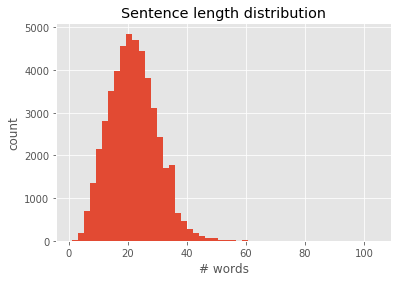

In [362]:
plt.hist([len(s) for s in sentence_list], bins=50)
plt.title('Sentence length distribution')
plt.xlabel('# words')
plt.ylabel('count')
plt.show()

<div class='explication'> </div>

**1.4.1 Create a word2idx dictionary mapping distinct words from the dataset into distinct integers. Also create a idx2word dictionary.**

In [24]:
word2idx = {word: idx for idx, word in enumerate(words)}
idx2word = {idx: word for idx, word in enumerate(words)}

In [364]:
print('The index of the work `{}` is {}'.format('Park', word2idx['Park']))

The index of the work `Park` is 11931


**1.4.2 Prepare the predictors matrix X, as a list of lists, where each inner list is a sequence of words mapped into integers accordly to the word2idx dictionary.**

In [370]:
X = [[word2idx[w[0]] for w in s] for s in sentence_list]

**1.4.3 Apply the keras pad_sequences function to standardize the predictors. You should retrieve a matrix with all padded sentences and length equal to max_len previously computed.**

In [372]:
X = pad_sequences(sequences=X, maxlen=max_len, padding='post', value=n_words-1)

In [374]:
print('The padded sequence for the sentence 0 is: ', X[0])

The padded sequence for the sentence 0 is:  [15077 27700 20969 24218 26434 33389  9684 33464 29396 33246 34660 24853
  8204 17364 20924 33246 34973 27700  4010 33786 23512 33242 20368    24
 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178
 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178
 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178
 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178
 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178
 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178
 35178 35178 35178 35178 35178 35178 35178 35178]


**1.4.4 Create a tag2idx dictionary mapping distinct named entity tags from the dataset into distinct integers.**

In [30]:
tag2idx = {tag: idx for idx, tag in enumerate(tags)}
idx2tag = {idx: tag for idx, tag in enumerate(tags)}

In [365]:
print('The index of the tag `{}` is {}'.format('B-geo', tag2idx['B-geo']))

The index of the tag `B-geo` is 2


**1.4.5 Prepare targets matrix Y, as a list of lists,where each inner list is a sequence of tags mapped into integers accordly to the tag2idx dictionary.**

In [385]:
y = [[tag2idx[w[1]] for w in s] for s in sentence_list]

**1.4.6 apply the keras pad_sequences function to standardize the targets. Inject the PAD tag for the padding words.**

In [386]:
y = pad_sequences(sequences=y, maxlen=max_len, padding='post', value=tag2idx['PAD'])

In [387]:
print('The padded tags for the sentence 0 is: ', y[0])

The padded tags for the sentence 0 is:  [16 16 16 16 16 16  2 16 16 16 16 16  2 16 16 16 16 16  3 16 16 16 16 16
 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17
 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17
 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17
 17 17 17 17 17 17 17 17]


**1.4.7 Use the to_categorical keras function to one-hot encode the tags**

In [388]:
y = np.array([to_categorical(i, num_classes=n_tags) for i in y])

In [389]:
y.shape

(47959, 104, 18)

In [390]:
print('The padded categorical tags for the sentence 0 is: ', y[0])

The padded categorical tags for the sentence 0 is:  [[0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]


**1.4.8 Split the dataset in train and test datasets (test 10%)**

In [391]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.1)

In [392]:
# Run this cell to show your results #
print("The index of word 'Harvard' is: {}\n".format(word2idx["Harvard"]))
print("Sentence 1: {}\n".format(X[1]))
print(X.shape)

The index of word 'Harvard' is: 7506

Sentence 1: [ 8193 27727 31033 33289 22577 33464 23723 16665 33464 31142 31319 28267
 27700 33246 28646 16052    21 16915 17349  7924 32879 32985 18238 23555
    24 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178
 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178
 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178
 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178
 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178
 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178 35178
 35178 35178 35178 35178 35178 35178 35178 35178]

(47959, 104)


In [393]:
# Run this cell to show your results #
print("The index of tag 'B-gpe' is: {}\n".format(tag2idx["B-gpe"]))
print("The tag of the last word in Sentence 1: {}\n".format(y[0][-1]))
print(np.array(y).shape)

The index of tag 'B-gpe' is: 3

The tag of the last word in Sentence 1: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]

(47959, 104, 18)


## Section 2: Modelling

After preparing the train and test sets, we are ready to build five models: 
* frequency-based baseline 
* vanilla feedforward neural network
* recurrent neural network
* gated recurrent neural network
* bidirectional gated recurrent neural network

More details are given about architecture in each model's section. The input/output dimensionalities will be the same for all models:
* input: ```[# of sentences, max_len]```
* output: ```[# of sentences, max_len, n_tags]```

We follow the information in each model's section to set up the architecture of each model. And the end of each training, weuse the ```store_model``` function to store the weights and architectures in the ```./models``` path for later testing.

A further ```plot_training_history``` helper function is used to check the training history.


In [394]:
# Store model
def store_keras_model(model, model_name):
    model_json = model.to_json() # serialize model to JSON
    with open("./models/{}.json".format(model_name), "w") as json_file:
        json_file.write(model_json)
    model.save_weights("./models/{}.h5".format(model_name)) # serialize weights to HDF5
    print("Saved model to disk")
    
# Plot history
def plot_training_history(history):
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1,len(loss)+1)

    plt.figure()
    plt.plot(epochs, loss, 'bo', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('epoch')
    plt.legend()
    plt.show()

In [395]:
# Load model 
def load_keras_model(model_name):
    # Load json and create model
    json_file = open('./models/{}.json'.format(model_name), 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    model = model_from_json(loaded_model_json)
    # Load weights into new model
    model.load_weights("./models/{}.h5".format(model_name))
    return model

### 2.1 Model 1: Baseline Model ###

Predict the tag of a word simply with the most frequently-seen named entity tag of this word from the training set.

e.g. word "Apple" appears 10 times in the training set; 7 times it was tagged as "Corporate" and 3 times it was tagged as "Fruit". If we encounter the word "Apple" in the test set, we predict it as "Corporate".

**Create an np.array ```baseline``` of length [n_words]**
where the ith element   ```baseline[i]``` is the index of the most commonly seen named entity tag of word i summarised from training set.   (e.g. [16, 16, 16, ..., 0, 16, 16])




<div class='explication'> </div>

In [415]:
word_tag_count = np.zeros((n_words, n_tags))
for i in range(X_train.shape[0]):
    for j in range(X_train[i].shape[0]):
        word_tag_count[X_train[i][j]][y_train[i][j]==1] += 1

In [566]:
baseline =  word_tag_count
#baseline = [np.argmax(a) for a in word_tag_count]

In [567]:
baseline = np.array(baseline)

In [572]:
baseline.shape

(35179, 18)

In [568]:
# Run this cell to show your results #

print(baseline[X].shape,'\n')
print('Sentence:\n {}\n'.format([idx2word[w] for w in X[0]]))
print('Predicted Tags:\n {}'.format([idx2tag[i] for i in np.argmax(baseline[X[0]],axis=-1)]))

(47959, 104, 18) 

Sentence:
 ['Thousands', 'of', 'demonstrators', 'have', 'marched', 'through', 'London', 'to', 'protest', 'the', 'war', 'in', 'Iraq', 'and', 'demand', 'the', 'withdrawal', 'of', 'British', 'troops', 'from', 'that', 'country', '.', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', 'ENDPAD', '

### 2.2. Model 2: Vanilla Feed Forward Neural Network ###



**(1) Explain what is embedding layer and why we need it here.**


We have a dictionary of 35179 words. Each word is represented by an integer between 0 and 35178. For predictive models, one-hot encoding of the discrete values is required. Therefore each word is be represented by a binary vector of 35179 elements, where 35178 of those are zeros. This results in a high dimension of size 35179 x 35179, which is not computationally efficient. Furthermore the similarity (e.g. cosine distance) between two one-hot encoded vectors does not say how similar the original words are. 

Embedding allows us to reduce dimensionality by projecting the one-hot encodings onto a lower dimensional and continuous space (e.g. size 25, 50 or 100). Embeddings are vectors, learned from training data, using an Embedding layer in Keras. In our case we learn 50-dimensional embeddings for each word to predict the tag. For example words that are associated with a geographical entity such as 'London' and 'Paris' will come out closer in the embedding space because the layer has learned that these are both associated with geo tag.

**(2) Explain why the Param # of Embedding layer is 1758950 (as shown in ```print(model.summary())```).**

When each of the 35179 words is represented by a 50-elements embeddings vector, then Embedding layer has to learn 35179 x 50 = 1758950 weights.

### Hyperparameters shared with other NN models

In [59]:
n_units = 100
drop_rate = .1
dim_embed = 50

optimizer = "rmsprop"
loss = "categorical_crossentropy"
metrics = ["accuracy"]

batch_size = 32
epochs = 10
validation_split = 0.1
verbose = 1

In [438]:
# use clear_session to start a new model #
backend.clear_session()

# Define model
model=Sequential()
model.add(Embedding(input_dim=n_words, output_dim=dim_embed, input_length=max_len))
model.add(Dropout(drop_rate))
model.add(Dense(n_tags, activation="softmax"))

# Compile model
model.compile(optimizer=optimizer, loss=loss, metrics=metrics)

In [439]:
print(model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 104, 50)           1758950   
_________________________________________________________________
dropout_1 (Dropout)          (None, 104, 50)           0         
_________________________________________________________________
dense_1 (Dense)              (None, 104, 18)           918       
Total params: 1,759,868
Trainable params: 1,759,868
Non-trainable params: 0
_________________________________________________________________
None


In [440]:
# Train model
history = model.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, 
                    validation_split=validation_split, verbose=verbose)

Train on 38846 samples, validate on 4317 samples
Epoch 1/10
38846/38846 [==============================] - 7s 170us/step - loss: 0.3208 - acc: 0.9776 - val_loss: 0.0606 - val_acc: 0.9857
Epoch 2/10
38846/38846 [==============================] - 6s 159us/step - loss: 0.0514 - acc: 0.9862 - val_loss: 0.0482 - val_acc: 0.9869
Epoch 3/10
38846/38846 [==============================] - 6s 156us/step - loss: 0.0449 - acc: 0.9872 - val_loss: 0.0453 - val_acc: 0.9875
Epoch 4/10
38846/38846 [==============================] - 6s 161us/step - loss: 0.0426 - acc: 0.9878 - val_loss: 0.0440 - val_acc: 0.9877
Epoch 5/10
38846/38846 [==============================] - 6s 159us/step - loss: 0.0412 - acc: 0.9882 - val_loss: 0.0433 - val_acc: 0.9880
Epoch 6/10
38846/38846 [==============================] - 6s 156us/step - loss: 0.0404 - acc: 0.9885 - val_loss: 0.0428 - val_acc: 0.9881
Epoch 7/10
38846/38846 [==============================] - 6s 158us/step - loss: 0.0398 - acc: 0.9886 - val_loss: 0.0428 - v

In [441]:
store_keras_model(model, 'model_FFNN')

Saved model to disk


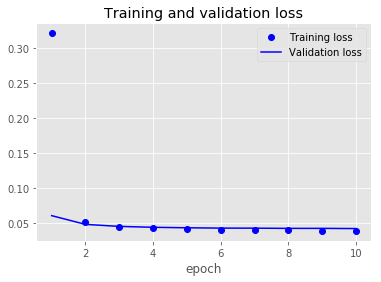

In [442]:
plot_training_history(history)

In addition to the final result, we also want to see the intermediate results from hidden layers. Below is a function showing how to get outputs from a hidden layer, and visualize them on the reduced dimension of 2D by PCA. 

In [81]:
FFNN=load_keras_model('model_FFNN')

def create_truncated_model_FFNN(trained_model):
    model=Sequential()
    model.add(Embedding(input_dim=n_words, output_dim=dim_embed, input_length=max_len))
    model.add(Dropout(drop_rate))
    # set weights of first few layers using the weights of trained model
    for i, layer in enumerate(model.layers):
        layer.set_weights(trained_model.layers[i].get_weights())
    model.compile(optimizer=optimizer, loss=loss, metrics=metrics)
    return model
truncated_model = create_truncated_model_FFNN(FFNN)
hidden_features = truncated_model.predict(X_tr)

# flatten data
hidden_features=hidden_features.reshape(-1,50)
y_tr=y_tr.reshape(-1,18)
 
# find first two PCA components
pca = PCA(n_components=2)
pca_result = pca.fit_transform(hidden_features)
print('Variance explained by PCA: {}'.format(np.sum(pca.explained_variance_ratio_)))

Variance explained by PCA: 0.9290592766724103


In [84]:
# visualize hidden featurs on first two PCA components
# this plot only shows B-tags
def visualize_hidden_features(pca_result):
    color=['r', 'C1', 'y', 'C3', 'b', 'g', 'm', 'orange']
    category = np.argmax(y_tr, axis=1)
    fig, ax = plt.subplots()
    fig.set_size_inches(6,6)    
    for cat in range(8):
        indices_B = np.where(category==cat)[0]
        #length=min(1000,len(indices_B))
        #indices_B=indices_B[:length]
        ax.scatter(pca_result[indices_B,0], pca_result[indices_B, 1], label=idx2tag[cat],s=2,color=color[cat],alpha=0.5)
        legend=ax.legend(markerscale=3)
        legend.get_frame().set_facecolor('w')  
    plt.show()

The function below is a generalized version of the given functions above.

In [431]:
def truncate_and_visualize(trained_model, truncated_model, truncated_output_dim, X, y):
    # set weights of first few layers using the weights of trained model
    for i, layer in enumerate(truncated_model.layers):
        layer.set_weights(trained_model.layers[i].get_weights())
    truncated_model.compile(optimizer=optimizer, loss=loss, metrics=metrics)
    # predict using the first few layers
    hidden_features = truncated_model.predict(X)
    # flatten data
    hidden_features=hidden_features.reshape(-1,truncated_output_dim)
    y=y.reshape(-1,18)
    # find first two PCA components
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(hidden_features)
    print('Variance explained by PCA: {}'.format(np.sum(pca.explained_variance_ratio_)))
    # visualize hidden featurs on first two PCA components
    color=['r', 'C1', 'y', 'C3', 'b', 'g', 'm', 'orange']
    category = np.argmax(y, axis=1)
    fig, ax = plt.subplots(1,2,figsize=(15,6))
    #fig.set_size_inches(6,6)    
    for cat in range(8):
        indices_B = np.where(category==cat)[0]
        ax[0].scatter(pca_result[indices_B,0], pca_result[indices_B, 1], label=idx2tag[cat],s=2,color=color[cat],alpha=0.5)
        legend=ax[0].legend(markerscale=3)
        legend.get_frame().set_facecolor('w')  
    for cat in range(8, 16):
        indices_B = np.where(category==cat)[0]
        ax[1].scatter(pca_result[indices_B,0], pca_result[indices_B, 1], label=idx2tag[cat],s=2,color=color[cat-8],alpha=0.5)
        legend=ax[1].legend(markerscale=3)
        legend.get_frame().set_facecolor('w')  
    plt.show()

Variance explained by PCA: 0.9244400031398592


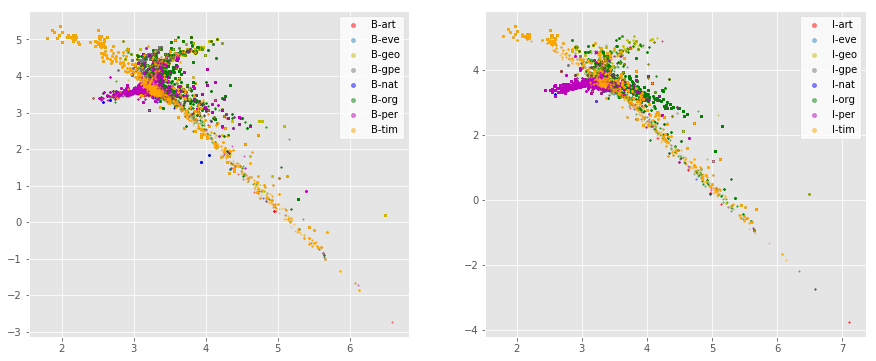

In [443]:
FFNN=load_keras_model('model_FFNN')
model=Sequential()
model.add(Embedding(input_dim=n_words, output_dim=dim_embed, input_length=max_len))
model.add(Dropout(drop_rate))
truncate_and_visualize(trained_model=FFNN, truncated_model=model, truncated_output_dim=dim_embed, X=X_train, y=y_train)

Visualizing the predictions from hidden layers helps understanding our model. We have reduced dimensionality from 50 down to 2D using Principal Component Analysis. PCA works by projecting the predictions onto the eigenvectors of their covariance matrix. This matrix quantifies the variance of embbedings and how much each embedding varies with respect to one another.

Our PCA variance is ca 0.92, which implies that the reduced dimensions do represent the hidden features well. 

Obviously, there are a lot of overlaps among tags. The embedding layer is not learning the representation well. We might achieve a better class separation by considering the context around the words, by looking at the words we previously encountered. This leads to recurrent layer.  

### 2.3 Model 3: RNN ###

(1) Set up a simple RNN model by stacking the following layers in sequence:
* an input layer
* a simple Embedding layer transforming integer words into vectors 
* a dropout layer to regularize the model
* a SimpleRNN layer 
* a TimeDistributed layer with an inner Dense layer which output dimensionality is equal to n_tag

(2) Compile the model

(3) Train the model and plot the training history

(4) Visualize outputs from SimpleRNN layer, one subplot for **B-tags** and one subplot for **I-tags**,comment on the patterns you observed.

For hyperparameters use those provided in Model 2

In [444]:
model_rnn=Sequential()
model_rnn.add(Embedding(input_dim=n_words, output_dim=dim_embed, input_length=max_len))
model_rnn.add(Dropout(drop_rate))
model_rnn.add(SimpleRNN(dim_embed, return_sequences=True))
model_rnn.add(TimeDistributed(Dense(n_tags, activation='softmax')))
# Compile model
model_rnn.compile(optimizer=optimizer, loss=loss, metrics=metrics)

In [445]:
history_rnn = model_rnn.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, 
                    validation_split=validation_split, verbose=verbose)

Train on 38846 samples, validate on 4317 samples
Epoch 1/10
38846/38846 [==============================] - 82s 2ms/step - loss: 0.1138 - acc: 0.9736 - val_loss: 0.0344 - val_acc: 0.9897
Epoch 2/10
38846/38846 [==============================] - 81s 2ms/step - loss: 0.0298 - acc: 0.9912 - val_loss: 0.0294 - val_acc: 0.9912
Epoch 3/10
38846/38846 [==============================] - 81s 2ms/step - loss: 0.0262 - acc: 0.9923 - val_loss: 0.0280 - val_acc: 0.9916
Epoch 4/10
38846/38846 [==============================] - 81s 2ms/step - loss: 0.0245 - acc: 0.9928 - val_loss: 0.0276 - val_acc: 0.9918
Epoch 5/10
38846/38846 [==============================] - 81s 2ms/step - loss: 0.0234 - acc: 0.9931 - val_loss: 0.0276 - val_acc: 0.9918
Epoch 6/10
38846/38846 [==============================] - 81s 2ms/step - loss: 0.0225 - acc: 0.9934 - val_loss: 0.0271 - val_acc: 0.9919
Epoch 7/10
38846/38846 [==============================] - 81s 2ms/step - loss: 0.0218 - acc: 0.9936 - val_loss: 0.0268 - val_acc:

In [446]:
# save your mode ##
store_keras_model(model_rnn, 'model_RNN')

Saved model to disk


In [447]:
# run this cell to show your results #
print(model_rnn.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_3 (Embedding)      (None, 104, 50)           1758950   
_________________________________________________________________
dropout_3 (Dropout)          (None, 104, 50)           0         
_________________________________________________________________
simple_rnn_1 (SimpleRNN)     (None, 104, 50)           5050      
_________________________________________________________________
time_distributed_1 (TimeDist (None, 104, 18)           918       
Total params: 1,764,918
Trainable params: 1,764,918
Non-trainable params: 0
_________________________________________________________________
None


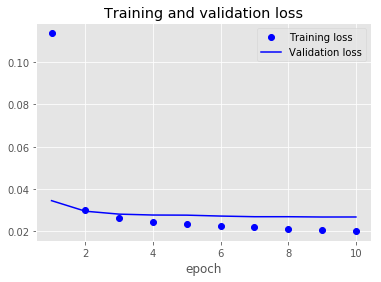

In [448]:
# run this cell to show your results #
plot_training_history(history_rnn)

Variance explained by PCA: 0.8609532470656105


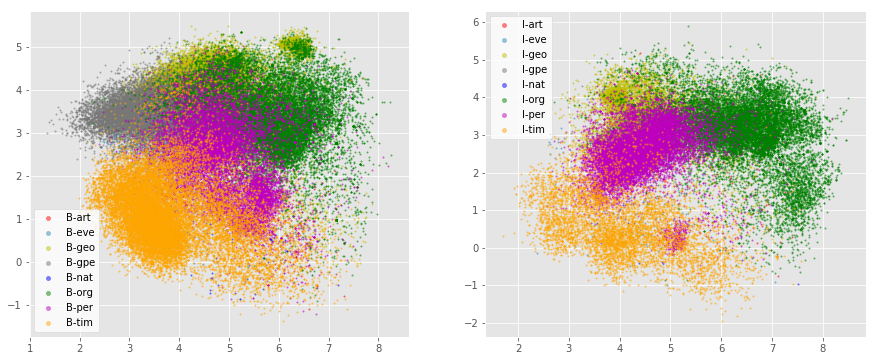

In [449]:
# visualization of hidden features

RNN=load_keras_model('model_RNN')
model=Sequential()
model.add(Embedding(input_dim=n_words, output_dim=dim_embed, input_length=max_len))
model.add(Dropout(drop_rate))
model.add(SimpleRNN(dim_embed, return_sequences=True))
truncate_and_visualize(trained_model=RNN, truncated_model=model, truncated_output_dim=dim_embed, X=X_train, y=y_train)

<div class='explication'> </div>

The plot above shows a better separation of classes (tags) when using a RNN, compared to FCNN. Although some overlapping is still visible, the beginning of named entity tags are clearly better learned than when using just an embedding layer.

The inside named entity tags however remain fairly mixed. The network could benefit from a long-term memory in order to able to recognize words which appear inside a context by remembering the long sequence of intermediate words which leads to them. This leads us to GRU.

Clusters of possible outliers are visible as islands, e.g. `I-per`.

The tags `B-tim` and `I-tim` are very well separated from the remaining tags.

### 2.4 Model 4: GRU ###

(1) Briefly explain what is GRU and how it is different from simple RNN

(2) build a GRU architecture by replacing the SimpleRNN cell with a GRU one. 

(3) Compile the model

(4) Train the model and plot the training history

(5) Visualize outputs from GRU layer, one subplot for **B-tags** and one subplot for **I-tags**, comment on the patterns you observed.

<div class='explication'> </div>

RNN suffers from short-term memory. When doing predicting tags for a very long sentence, RNN may leave out important information from the beginning of the sentence. Furthermore vanishing gradients might occur, what stops the learning process.

GRU introduces probabilistic gates (reset and update) which are able to learn parts of the sentences which are important and parts which can be forgotten. RNN uses hidden states as memory and tanh to solve exploding gradients. GRU brings additional tensor operations with sigmoid to forget (0) or keep (1).

In [450]:
model_gru=Sequential()
model_gru.add(Embedding(input_dim=n_words, output_dim=dim_embed, input_length=max_len))
model_gru.add(Dropout(drop_rate))
model_gru.add(GRU(dim_embed, return_sequences=True))
model_gru.add(TimeDistributed(Dense(n_tags, activation='softmax')))
# Compile model
model_gru.compile(optimizer=optimizer, loss=loss, metrics=metrics)

In [451]:
history_gru = model_gru.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, 
                    validation_split=validation_split, verbose=verbose)

Train on 38846 samples, validate on 4317 samples
Epoch 1/10
38846/38846 [==============================] - 169s 4ms/step - loss: 0.1138 - acc: 0.9735 - val_loss: 0.0343 - val_acc: 0.9901
Epoch 2/10
38846/38846 [==============================] - 169s 4ms/step - loss: 0.0299 - acc: 0.9913 - val_loss: 0.0294 - val_acc: 0.9913
Epoch 3/10
38846/38846 [==============================] - 168s 4ms/step - loss: 0.0262 - acc: 0.9923 - val_loss: 0.0278 - val_acc: 0.9917
Epoch 4/10
38846/38846 [==============================] - 168s 4ms/step - loss: 0.0244 - acc: 0.9928 - val_loss: 0.0273 - val_acc: 0.9918
Epoch 5/10
38846/38846 [==============================] - 168s 4ms/step - loss: 0.0232 - acc: 0.9932 - val_loss: 0.0267 - val_acc: 0.9920
Epoch 6/10
38846/38846 [==============================] - 169s 4ms/step - loss: 0.0222 - acc: 0.9935 - val_loss: 0.0264 - val_acc: 0.9921
Epoch 7/10
38846/38846 [==============================] - 168s 4ms/step - loss: 0.0215 - acc: 0.9937 - val_loss: 0.0262 - v

In [452]:
# save your model #
store_keras_model(model_gru, 'model_GRU')

Saved model to disk


In [453]:
model_gru=load_keras_model('model_GRU')

In [454]:
# run this cell to show your results #
print(model_gru.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_5 (Embedding)      (None, 104, 50)           1758950   
_________________________________________________________________
dropout_5 (Dropout)          (None, 104, 50)           0         
_________________________________________________________________
gru_1 (GRU)                  (None, 104, 50)           15150     
_________________________________________________________________
time_distributed_2 (TimeDist (None, 104, 18)           918       
Total params: 1,775,018
Trainable params: 1,775,018
Non-trainable params: 0
_________________________________________________________________
None


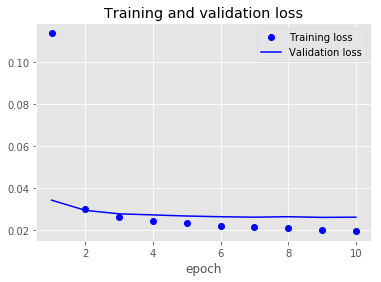

In [455]:
# run this cell to show your results #
plot_training_history(history_gru)

Variance explained by PCA: 0.8454723780601535


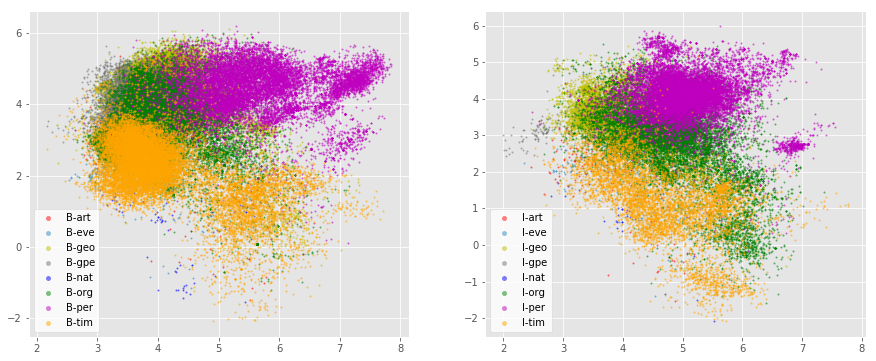

In [456]:
# visualization of hidden features

model_GRU=load_keras_model('model_GRU')
model=Sequential()
model.add(Embedding(input_dim=n_words, output_dim=dim_embed, input_length=max_len))
model.add(Dropout(drop_rate))
model.add(GRU(dim_embed, return_sequences=True))
truncate_and_visualize(trained_model=model_GRU, truncated_model=model, truncated_output_dim=dim_embed, X=X_train, y=y_train)

<div class='explication'> </div>

Adding long-term memory by using GRU appears to improve the classification of `inside entity` tags, as shown above. Clusters of possible outliers are visible as islands, e.g. `I-per`.

### 2.5 Model 5: Bidirectional GRU ###

(1) Explain what is Bidirectional GRU and how it is different from GRU model above.

(2) Then build a bidirectional GRU by wrapping your GRU layer into a Bidirectional one

(3) Compile the model

(4) Train the model and plot the training history

(5) Visualize outputs from bidirectional GRU layer, one subplot for **B-tags** and one subplot for **I-tags**, comment on the patterns you observed.

<div class='explication'> </div>

BiGRU allows for the use of information from both previous words and later words to make predictions about the current word. Practically, the RNN is duplicated, one is trained with the words sequence in original order and the second is trained with the words sequence in reverse order. Both outputs are concatenated or summed up. This allows the network to have backward and forward information at each time step. Normal GRU only uses past (backward) information. This is especially usefull for identifying inside-tags from beginning-tags.

In [457]:
model_bigru=Sequential()
model_bigru.add(Embedding(input_dim=n_words, output_dim=dim_embed, input_length=max_len))
model_bigru.add(Dropout(drop_rate))
model_bigru.add(Bidirectional(GRU(dim_embed, return_sequences=True)))
model_bigru.add(TimeDistributed(Dense(n_tags, activation='softmax')))
# Compile model
model_bigru.compile(optimizer=optimizer, loss=loss, metrics=metrics)

In [458]:
history_bigru = model_bigru.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, 
                    validation_split=validation_split, verbose=verbose)

Train on 38846 samples, validate on 4317 samples
Epoch 1/10
38846/38846 [==============================] - 320s 8ms/step - loss: 0.0877 - acc: 0.9787 - val_loss: 0.0289 - val_acc: 0.9916
Epoch 2/10
38846/38846 [==============================] - 318s 8ms/step - loss: 0.0252 - acc: 0.9927 - val_loss: 0.0244 - val_acc: 0.9927
Epoch 3/10
38846/38846 [==============================] - 318s 8ms/step - loss: 0.0214 - acc: 0.9938 - val_loss: 0.0230 - val_acc: 0.9930
Epoch 4/10
38846/38846 [==============================] - 318s 8ms/step - loss: 0.0196 - acc: 0.9943 - val_loss: 0.0222 - val_acc: 0.9934
Epoch 5/10
38846/38846 [==============================] - 317s 8ms/step - loss: 0.0182 - acc: 0.9947 - val_loss: 0.0221 - val_acc: 0.9934
Epoch 6/10
38846/38846 [==============================] - 318s 8ms/step - loss: 0.0172 - acc: 0.9949 - val_loss: 0.0219 - val_acc: 0.9935
Epoch 7/10
38846/38846 [==============================] - 318s 8ms/step - loss: 0.0163 - acc: 0.9952 - val_loss: 0.0222 - v

In [459]:
# save your model #
store_keras_model(model_bigru, 'model_BiGRU')

Saved model to disk


In [460]:
# run this cell to show your results #
print(model_bigru.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_7 (Embedding)      (None, 104, 50)           1758950   
_________________________________________________________________
dropout_7 (Dropout)          (None, 104, 50)           0         
_________________________________________________________________
bidirectional_1 (Bidirection (None, 104, 100)          30300     
_________________________________________________________________
time_distributed_3 (TimeDist (None, 104, 18)           1818      
Total params: 1,791,068
Trainable params: 1,791,068
Non-trainable params: 0
_________________________________________________________________
None


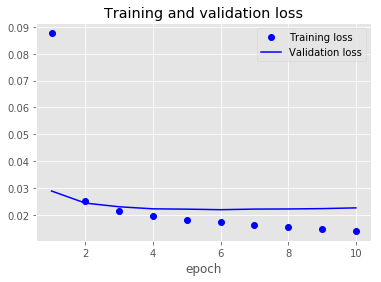

In [461]:
# run this cell to show your results #
plot_training_history(history_bigru)

Variance explained by PCA: 0.8407372361918702


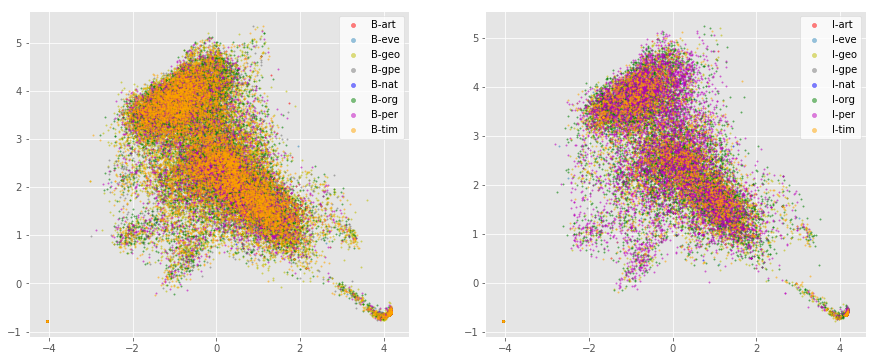

In [462]:
# visualization of hidden features

model_BiGRU=load_keras_model('model_BiGRU')
model=Sequential()
model.add(Embedding(input_dim=n_words, output_dim=dim_embed, input_length=max_len))
model.add(Dropout(drop_rate))
model.add(Bidirectional(GRU(dim_embed, return_sequences=True)))
truncate_and_visualize(trained_model=model_BiGRU, truncated_model=model, truncated_output_dim=dim_embed, X=X_train, y=y_train)

The above scatterplots are characterized by the absence of clusters. This result is somehow surprising because we expected the BGRU layer activation to project into a space where the classes are better separated. The 2 BiGRU PCA components explain 84% of variance in the data, compared to 85% when using simple GRU. In both cases additional components are needed for separating classes.

We also observed a kind of linear decresing relationship among both PCA components. This could suggest that the layer is not fully capturing the non-linearity in the data. We might need to add additional hidden layers to learn deeper and more complex feature representations from this output. 

Non-linear dimensionality reduction (e.g. t-SNE t-distributed Stochastic Neighbor Embedding) might be necessary to further investigate the BiGRU hidden layer, especially about insights of classification obtainable by projection of the layer. [Source](http://www.cs.rug.nl/~alext/PAPERS/VAST16/paper.pdf)

## Part 3: Analysis


**3.1**


For each model iteratively:

(1) Load the model using the given function ```load_keras_model```

(2) Apply the model to the test dataset

(3) Compute an F1 score for each ```Tag``` and store it 

(4) Plot the F1 score per Tag and per model making use of a grouped barplot.

(5) Briefly discuss the performance of each model

The following function returns tag labels corresponding to a prediction matrix.

In [534]:
def pred2label(pred):
    labels = []
    for pred_i in pred:
        label = []
        for p in pred_i:
            p_i = np.argmax(p)
            label.append(idx2tag[p_i])
        labels.append(label)
    return np.array(labels).flatten()

The function below uses the input model to predict an input matrix. It returns the F1 scores per tag, as well as the predicted labels.

In [597]:
def compute_f1_score(model_name, X, y):
    if model_name=='baseline':
        preds = baseline[X]
    else:
        model = load_keras_model(model_name)
        preds = model.predict(X)
    pred_labels = pred2label(preds)
    print("{}: F1-score: {:.1%}".format(model_name, f1_score(y, pred_labels, average='weighted')))
    f1_scores = classification_report(y, pred_labels, output_dict=True)
    df = pd.DataFrame(f1_scores)[tags].reset_index().rename(columns={'index': 'Metric'})
    df = pd.melt(df, id_vars=["Metric"], 
                       var_name="Tag", value_name="Value")
    df = df[['Tag', 'Metric','Value']]
    df['Model'] = model_name
    return df, pred_labels

Below we evaluate all models on test dataset and store the F1 scores in a dataframe, as well as predicted labels.

In [789]:
import warnings
warnings.filterwarnings('ignore') 

models = ['baseline', 'model_FFNN', 'model_RNN', 'model_GRU', 'model_BiGRU']

test_labels = pred2label(y_test)
df_predictions = pd.DataFrame()
df_predictions['Word'] = [idx2word[w] for w in X_test.reshape(-1,)]
df_predictions['y_true'] = test_labels

df_f1_scores = pd.DataFrame(columns=['Model', 'Tag', 'Metric', 'Value'])

for i in range(len(models)):
    f1, pred_labels = compute_f1_score(models[i], X_test, test_labels)
    df_f1_scores = df_f1_scores.append(f1, sort=False)
    df_predictions[models[i]] = pred_labels

baseline: F1-score: 98.8%
model_FFNN: F1-score: 98.7%
model_RNN: F1-score: 99.2%
model_GRU: F1-score: 99.2%
model_BiGRU: F1-score: 99.3%


The function below displays the F1 scores as grouped bar plot.

In [688]:
def plot_f1_scores(df_f1_scores):
    fig, ax = plt.subplots(1,1,figsize=(20,7))
    sns.barplot(data=df_f1_scores[(df_f1_scores.Metric=='f1-score') & (~df_f1_scores.Tag.isin(['PAD']))], x='Tag', y='Value', hue='Model', ax=ax)
    plt.xticks(fontsize=14)
    ax.set_ylabel('F1 Score')
    ax.set_title('F1 Scores per Tag and Model');

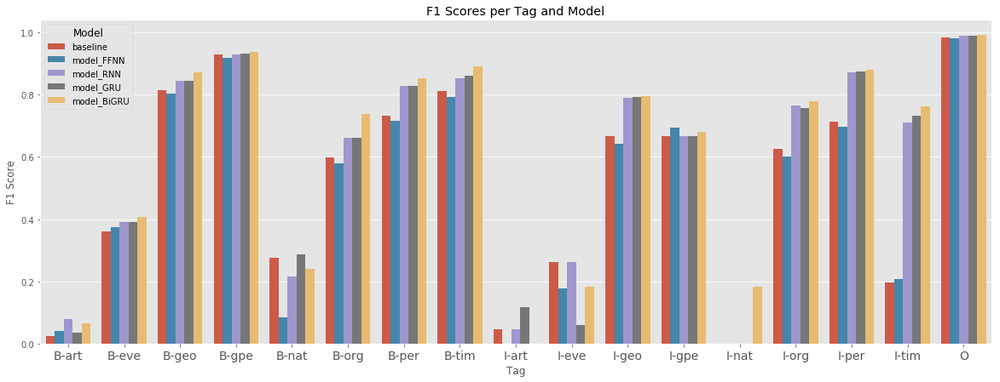

In [790]:
plot_f1_scores(df_f1_scores)

The overall weighted F1 score is roughtly the same for all models (see below):

- baseline: F1-score: 98.8%
- model_FFNN: F1-score: 98.7%
- model_RNN: F1-score: 99.2%
- model_GRU: F1-score: 99.2%
- model_BiGRU: F1-score: 99.3%

However, we observe that the performance varies among Tags. The plot above shows the weighted F1 score obtained with the models on test dataset per Tag. 

- The `art` and `nat` tags are the worst performers, followed by `eve`, with F1 score less than 50%, both at the beginning and inside the named entities.   
- The `gpe`, `geo`, `tim` and `per` tags are the best performers, followed by `org`, with F1 score over 80%.
- Inside tags perform worse than beginning tags, in general.


- Models with increasing complexity delivers a better classification. 
- FFNN has the lowest F1 score. The baseline model outperforms FFNN.
- BiGRU provides the best classification. BiGRU is the only option that works well for both tag types (beginning and inside). 


**Question 3.2**</span>

(1) Which tags have the lowest f1 score? 

For instance, you may find from the plot above that the test accuracy on "B-art", and "I-art" are very low (just an example, your case maybe different). Here is an example when models failed to predict these tags right

<img src="./data/B_art.png" alt="drawing" width="600"/>


(2) Write functions to output another example in which the tags of the lowest accuracy was predicted wrong in a sentence (include both "B-xxx" and "I-xxx" tags). Store the results in a DataFrame (same format as the above example) and use styling functions below to print out your df.

In [614]:
def highlight_errors(s):
    is_max = s == s.y_true
    return ['' if v or key=='Word' else 'color: red' for key,v in is_max.iteritems()]

In [2]:
# run this cell to show you result #
your_df.style.apply(highlight_errors, axis=1)

In [621]:
#df_predictions = df_predictions[df_predictions.Word!='ENDPAD']
df_predictions_wrong = df_predictions[(df_predictions.y_true!=df_predictions.baseline) |
                                        (df_predictions.y_true!=df_predictions.model_FFNN) |
                                        (df_predictions.y_true!=df_predictions.model_RNN) |
                                        (df_predictions.y_true!=df_predictions.model_GRU) |
                                        (df_predictions.y_true!=df_predictions.model_BiGRU)]

In [622]:
df_predictions_wrong.style.apply(highlight_errors, axis=1)

In [624]:
df_predictions_wrong[(df_predictions_wrong.y_true=='B-art') | (df_predictions_wrong.y_true=='I-art')].style.apply(highlight_errors, axis=1)

,Word,y_true,baseline,model_FFNN,model_RNN,model_GRU,model_BiGRU
1776,Emergency,B-art,I-org,O,O,I-org,O
1777,Law,I-art,O,O,O,I-org,O
16025,State,B-art,B-org,B-org,B-org,B-org,B-org
16026,Guest,I-art,I-org,O,I-org,I-org,I-org
16027,House,I-art,I-org,I-org,I-org,I-org,I-org
31625,El~Commercio,B-art,B-art,O,B-geo,O,O
38486,Saltillo,B-art,B-art,O,B-org,O,B-geo
41621,No,B-art,O,O,O,O,O
41622,Child,I-art,O,O,O,O,O
41623,Left,I-art,O,O,O,O,O


<img src="red_tags1.jpg" alt="drawing" width="600"/>
<img src="red_tags2.jpg" alt="drawing" width="600"/>

**3.3**

(1) Choose one of the most promising models you have built, improve this model to achieve the f1 score higher than 0.8 for as many tags as possible ( you have lots of options here, e.g. data balancing, hyperparameter tuning, changing the structure of NN, a different optimizer, ... )

(2) Explain why you choose to change certain elements of the model and how effective those adjustments are.


The Bidirectional GRU model achives the highest weighted F1 score overall and accross tags. Although the PCA plot for BiGRU did shows the worse class separation, the good F1 scores accross each single class is a strong argument to go further with BiGRU as model. 

The BiGRU model however shows weakness on `art`, `eve` and `nat` tags, as shown in F1 scores below.

In [630]:
df_f1_scores[(df_f1_scores.Metric=='f1-score') & 
             (df_f1_scores.Tag.isin(['B-art','I-art','B-eve','I-eve','B-nat','I-nat'])) & 
             (df_f1_scores.Model=='model_BiGRU')]

,Model,Tag,Metric,Value
0,model_BiGRU,B-art,f1-score,0.064516
4,model_BiGRU,B-eve,f1-score,0.408163
16,model_BiGRU,B-nat,f1-score,0.240000
32,model_BiGRU,I-art,f1-score,0.000000
36,model_BiGRU,I-eve,f1-score,0.181818
48,model_BiGRU,I-nat,f1-score,0.181818


A reason why the BiGRU is behaving poorly could be because the tag (classes) are imbalanced. There are only few words tagged with `art`, `eve` and `nat`.

In [631]:
data.Tag.value_counts()

O        887908
B-geo     37644
B-tim     20333
B-org     20143
I-per     17251
B-per     16990
I-org     16784
B-gpe     15870
I-geo      7414
I-tim      6528
B-art       402
B-eve       308
I-art       297
I-eve       253
B-nat       201
I-gpe       198
I-nat        51
Name: Tag, dtype: int64

The training data is imbalanced as well.

In [698]:
pd.DataFrame(pred2label(y_train))[0].value_counts()

PAD      3545169
O         799338
B-geo      33832
B-tim      18348
B-org      18084
I-per      15492
B-per      15241
I-org      15077
B-gpe      14304
I-geo       6656
I-tim       5913
B-art        355
B-eve        273
I-art        259
I-eve        224
B-nat        180
I-gpe        166
I-nat         41
Name: 0, dtype: int64

Data balancing is typically performed in such a situation. A number of more sophisticated resampling techniques have been proposed in the scientific literature, especially using the Python library imbalanced-learn. SMOTE (Synthetic Minority Oversampling TEchnique) consists of creating new samples for the minority class, by picking a sample from that class and computing the k-nearest neighbors, then adding a new sample between the chosen sample and its neighbors.

Because SMOTE works best on a 2D space, we first need to flatten training data.

In [712]:
y_train2 = np.array([[np.argmax(w) for w in s] for s in y_train])
y_train2.shape

(43163, 104)

In [716]:
X_train2 = X_train.flatten().reshape(-1,1)
y_train2 = y_train2.flatten().reshape(-1,1)
X_train2.shape, y_train2.shape

((4488952, 1), (4488952, 1))

Now we can upsample all tags to the size of the majority tag class.  

In [743]:
try:
    __import__('imp').find_module('imblearn')
    from imblearn.over_sampling import SMOTE
    smote = SMOTE()
    X_train_augmented, y_train_augmented = smote.fit_sample(X_train2, y_train2)
except ImportError:
    X_train_augmented, y_train_augmented = X_train, y_train

After upsampling we need to reshape the resulting 1D vector back to a 3D tensor (sentence, word) and (sentence, word, tag). In order to do so, we truncate the last sentence back to 104 words.

In [701]:
nb = 104*(X_train_augmented.shape[0]//104)
nb/104

613586.0

In [702]:
X_train_augmented.shape, y_train_augmented.shape, X_train.shape, y_train.shape

((63813042, 1), (63813042,), (43163, 104), (43163, 104, 18))

In [703]:
X_train_augmented2 = X_train_augmented[:nb].reshape(-1,104)

In [704]:
y_train_augmented2 = y_train_augmented[:nb].reshape(-1,104)

In [705]:
y_train_augmented2.shape

(613586, 104)

In [706]:
y_train_augmented2 = np.array([to_categorical(i, num_classes=n_tags) for i in y_train_augmented2])

As shown below, we end up with over 15 times the number of samples in the original training dataset. Each tag is equally represented.

In [733]:
y_train_augmented2.shape, X_train_augmented2.shape, X_train.shape, y_train.shape

((613586, 104, 18), (613586, 104), (43163, 104), (43163, 104, 18))

In [708]:
pd.DataFrame(pred2label(y_train_augmented2))[0].value_counts()

B-gpe    3545169
B-art    3545169
B-tim    3545169
PAD      3545169
B-eve    3545169
I-gpe    3545169
I-art    3545169
I-org    3545169
I-per    3545169
B-geo    3545169
I-nat    3545169
I-tim    3545169
B-per    3545169
I-eve    3545169
B-nat    3545169
I-geo    3545169
B-org    3545169
O        3545071
Name: 0, dtype: int64

We can now train a bidirectional GRU model on the augmented data. And wait a long time for training to complete.

In [734]:
model_bigru2=Sequential()
model_bigru2.add(Embedding(input_dim=n_words, output_dim=dim_embed, input_length=max_len))
model_bigru2.add(Dropout(drop_rate))
model_bigru2.add(Bidirectional(GRU(dim_embed, return_sequences=True)))
model_bigru2.add(TimeDistributed(Dense(n_tags, activation='softmax')))
# Compile model
model_bigru2.compile(optimizer=optimizer, loss=loss, metrics=metrics)
history_bigru2 = model_bigru2.fit(X_train_augmented2, y_train_augmented2, batch_size=batch_size, epochs=10, 
                    validation_split=validation_split, verbose=verbose)

Train on 552227 samples, validate on 61359 samples
Epoch 1/2
552227/552227 [==============================] - 4447s 8ms/step - loss: 0.0150 - acc: 0.9970 - val_loss: 7.1874 - val_acc: 0.4420
Epoch 2/2
552227/552227 [==============================] - 4492s 8ms/step - loss: 0.0019 - acc: 0.9995 - val_loss: 7.4575 - val_acc: 0.4438


In [735]:
store_keras_model(model_bigru2, 'model_BiGRU2')

Saved model to disk


We can now evaluate the newly trained BiGRU model on test dataset and compare with our previous models.

In [791]:
f1, pred_labels = compute_f1_score('model_BiGRU2', X_test, test_labels)
df_f1_scores = df_f1_scores.append(f1, sort=False)
df_predictions['model_BiGRU2'] = pred_labels

model_BiGRU2: F1-score: 99.3%


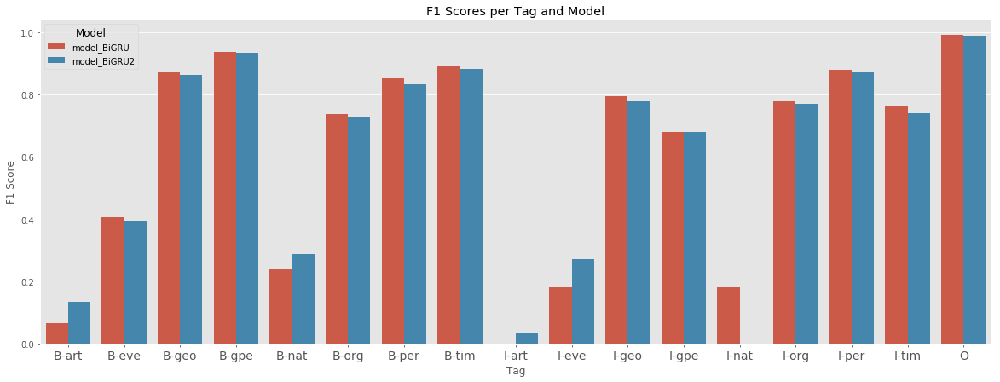

In [792]:
plot_f1_scores(df_f1_scores[df_f1_scores.Model.isin(['model_BiGRU','model_BiGRU2'])])

SMOTE data augmentation slightly improved the F1 score obtained on the minority classes `B-nat`, `B-art`, `I-eve`, `I-art`. Overall however there is no major benefit in augmenting data using SMOTE. This could be because of the data manipulation we had to perform (flattening, truncating and reshaping), which resulted in loosing some variation which affects tagging. This result could also be related to the low number of epochs during training. 

Below we implement our own data augmentation algorithm, by duplicating sentences containing words from the minority classes. The algorithm attemps to multiply minority tags so that their count is closed to the total count of `B-geo` tags. By doing so, we also increase the number of tags in the mojority class, but we also certainly reduce the dominance of the majority class. Our algorithm over-samples all classes however by putting more weight on minority ones, we reduce unbalenced effect.

In [773]:
X_train3 = X_train.copy()
y_train3 = np.array([[np.argmax(w) for w in s] for s in y_train])
majority_class = tag2idx['B-geo']
majority_tags = np.array([np.sum(s==majority_class) for s in y_train3])
majority_tags_count = np.sum(majority_tags)
candidate_tags = set(tags)-set(['PAD','O','B-geo'])
for tag in candidate_tags:
    minority_class = tag2idx[tag]
    minority_tags = np.array([np.sum(s==minority_class) for s in y_train3])
    minority_tags_count = np.sum(minority_tags)
    while minority_tags_count < majority_tags_count:
        s_idx = minority_tags >= 1
        y_train3 = np.append(y_train3,y_train3[s_idx], axis=0)
        X_train3 = np.append(X_train3,X_train3[s_idx], axis=0)
        minority_tags = np.array([np.sum(s==minority_class) for s in y_train3])
        minority_tags_count = np.sum(minority_tags)

In [766]:
y_train3.shape, X_train3.shape

((78968, 104), (78968, 104))

In [778]:
y_train3 = np.array([to_categorical(i, num_classes=n_tags) for i in y_train3])

The new tags distribution is given below. The ratio of tags in the most minority class over the majority class has changed from ca. 0.1% to ca. 25%.

In [775]:
pd.DataFrame(pred2label(y_train3))[0].value_counts()

PAD      20906777
O         4635416
B-geo      193957
B-tim      166756
I-per      142024
B-gpe      124654
B-per      109243
I-art      107520
B-art      101028
I-geo       89764
B-org       89731
I-eve       77120
I-nat       73472
B-nat       73381
I-org       68347
I-gpe       67008
B-eve       62562
I-tim       49936
Name: 0, dtype: int64

In [776]:
41/33000, 49900/193957

(0.0012424242424242424, 0.25727351938831805)

We will noe fit a BiGRU model on the newly augmented data.

In [780]:
model_bigru3=Sequential()
model_bigru3.add(Embedding(input_dim=n_words, output_dim=dim_embed, input_length=max_len))
model_bigru3.add(Dropout(drop_rate))
model_bigru3.add(Bidirectional(GRU(dim_embed, return_sequences=True)))
model_bigru3.add(TimeDistributed(Dense(n_tags, activation='softmax')))
# Compile model
model_bigru3.compile(optimizer=optimizer, loss=loss, metrics=metrics)
history_bigru3 = model_bigru3.fit(X_train3, y_train3, batch_size=batch_size, epochs=2, 
                    validation_split=validation_split, verbose=verbose, shuffle=True)

Train on 234854 samples, validate on 26095 samples
Epoch 1/2
234854/234854 [==============================] - 1925s 8ms/step - loss: 0.0262 - acc: 0.9935 - val_loss: 8.2095e-04 - val_acc: 0.9998
Epoch 2/2
234854/234854 [==============================] - 1927s 8ms/step - loss: 0.0083 - acc: 0.9976 - val_loss: 2.3644e-04 - val_acc: 1.0000


In [ ]:
store_keras_model(model_bigru3, 'model_BiGRU3')

model_BiGRU3: F1-score: 99.2%


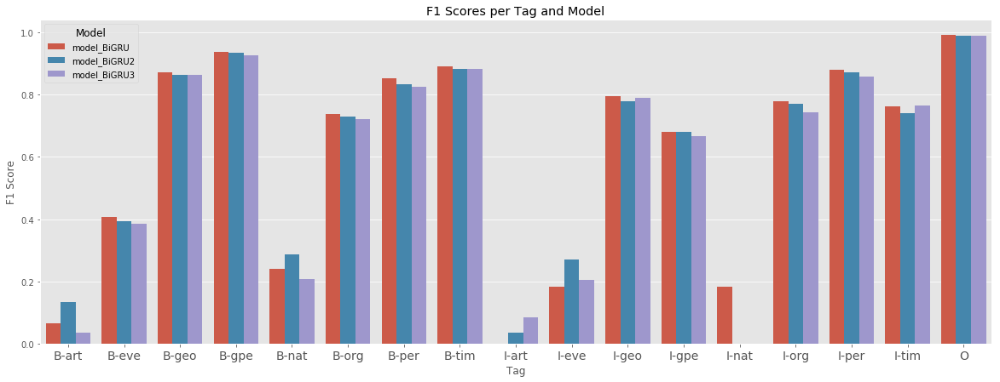

In [793]:
f1, pred_labels = compute_f1_score('model_BiGRU3', X_test, test_labels)
df_f1_scores = df_f1_scores.append(f1, sort=False)
df_predictions['model_BiGRU3'] = pred_labels
plot_f1_scores(df_f1_scores[df_f1_scores.Model.isin(['model_BiGRU','model_BiGRU2','model_BiGRU3'])])

In [794]:
df_f1_scores[(df_f1_scores.Metric=='f1-score') & 
             (df_f1_scores.Tag.isin(['I-art'])) & 
             (df_f1_scores.Model.isin(['model_BiGRU','model_BiGRU2','model_BiGRU3']))].sort_values(by='Tag')

,Model,Tag,Metric,Value
32,model_BiGRU,I-art,f1-score,0.000000
32,model_BiGRU2,I-art,f1-score,0.036364
32,model_BiGRU3,I-art,f1-score,0.085106


Our data augmentation algorithm improves `I-art` classification. SMOTE remains better in the other classes.

We can think of further tentatives to improve the accuracy in the minority classes:

- by using Naive Bayes or Support Vector Machines, whh work very well with less data
- by adding more hidden layers and looking closer at hyperparameters such as learning rate, momentum, initializer, optimizers, embedding size.
- by including Attentional context.
- by increasing training epochs.